In [64]:
import os
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmocean

In [2]:
plt.style.use("~/nice.mplstyle")

In [4]:
fig_dir = "./figures"
if not os.path.isdir(fig_dir):
    os.makedirs(fig_dir)

## Compare Nested-EAGLE with HRRR and GFS initial conditions over CONUS

In [68]:
metric = "bias"
dsdict = {
    metric: xr.open_dataset(f"/pscratch/sd/t/timothys/nested-eagle/0.25deg-06km/production/gfs-hrrr/stage1c/inference-testing/spatial-metrics-vs-fakehrrr/spatial.diff.{metric}.nested-lamvnested-lam.fc1vfc2.nc")
    for metric in ["bias", "variance", "rmse"]
}
dsdict["bias2"] = dsdict["bias"]**2
dsdict["mse"] = dsdict["rmse"]**2

In [73]:
dsdict["bias2"]

<xarray.Dataset> Size: 91MB
Dimensions:         (x: 848, y: 480, fhr: 9)
Coordinates:
  * x               (x) int64 7kB 0 1 2 3 4 5 6 ... 841 842 843 844 845 846 847
  * y               (y) int64 4kB 0 1 2 3 4 5 6 ... 473 474 475 476 477 478 479
  * fhr             (fhr) int64 72B 0 6 12 18 24 30 36 42 48
    latitude        (y, x) float32 2MB ...
    longitude       (y, x) float32 2MB ...
    lead_time       (fhr) timedelta64[ns] 72B ...
Data variables:
    sp              (fhr, y, x) float32 15MB 244.5 226.5 302.8 ... 36.67 37.4
    u10             (fhr, y, x) float32 15MB 0.006339 0.008177 ... 0.0001838
    v10             (fhr, y, x) float32 15MB 0.01031 0.008573 ... 0.003924
    t2m             (fhr, y, x) float32 15MB 0.0007841 0.0003347 ... 0.008096
    sh2             (fhr, y, x) float32 15MB 3.853e-07 3.84e-07 ... 1.011e-10
    10m_wind_speed  (fhr, y, x) float32 15MB 0.009506 0.009437 ... 0.002424

In [69]:
fhrs = [0, 6, 24]

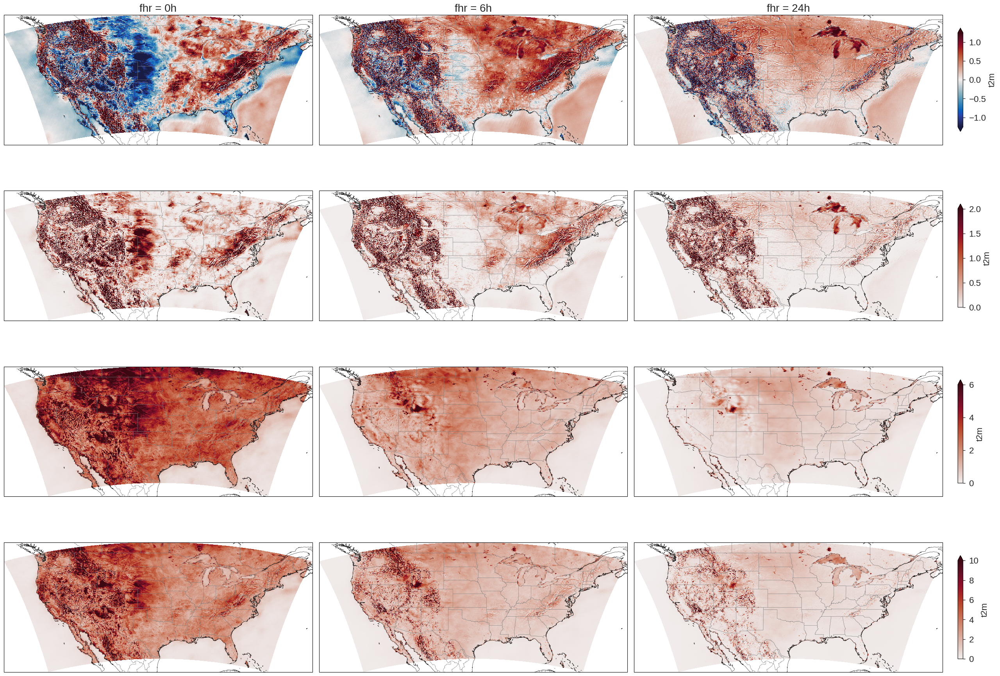

In [81]:
metrics = ["bias", "bias2", "variance", "mse"]
varname = "t2m"
nrows = len(metrics)
ncols = len(fhrs)
fig, axs = plt.subplots(nrows, ncols, figsize=(8.5*ncols, 4.5*nrows), constrained_layout=True, sharey=True, sharex=True, subplot_kw={"projection": ccrs.PlateCarree()})

vmin = {
    "bias2": 0,
    "bias": -1.25,
    "variance": 0,
    "mse": 0,
}

vmax = {
    "bias2": 2,
    "bias": 1.25,
    "variance": 6,
    "mse": 10,
}
for metric, axr in zip(metrics, axs):
    xds = dsdict[metric]
    for fhr, ax in zip(fhrs, axr):

        gs = ax.get_subplotspec()
        is_last_col = ax.get_subplotspec().is_last_col()
        xds[varname].sel(fhr=fhr).plot(
            ax=ax,
            x="longitude",
            y="latitude",
            vmin=vmin[metric],
            vmax=vmax[metric],
            cmap="cmo.balance" if metric == "bias" else "cmo.amp",
            transform=ccrs.PlateCarree(),
            add_colorbar=True if is_last_col  else False,
            cbar_kwargs={
                "shrink": .6,
            } if is_last_col else None, 
        )
        ax.add_feature(cf.STATES.with_scale('10m'), edgecolor='gray', facecolor='none')
        ax.add_feature(cf.COASTLINE.with_scale('10m'))
        ax.set(title="")
        if gs.is_first_row():
            ax.set(title=f"fhr = {fhr}h")
        if gs.is_last_row():
            ax.set(xlabel=f"fhr = {fhr}h")
        if gs.is_first_col():
            ax.set(ylabel=metric)
fig.savefig(f"{fig_dir}/spatial_{varname}.jpeg", dpi=300, bbox_inches="tight")

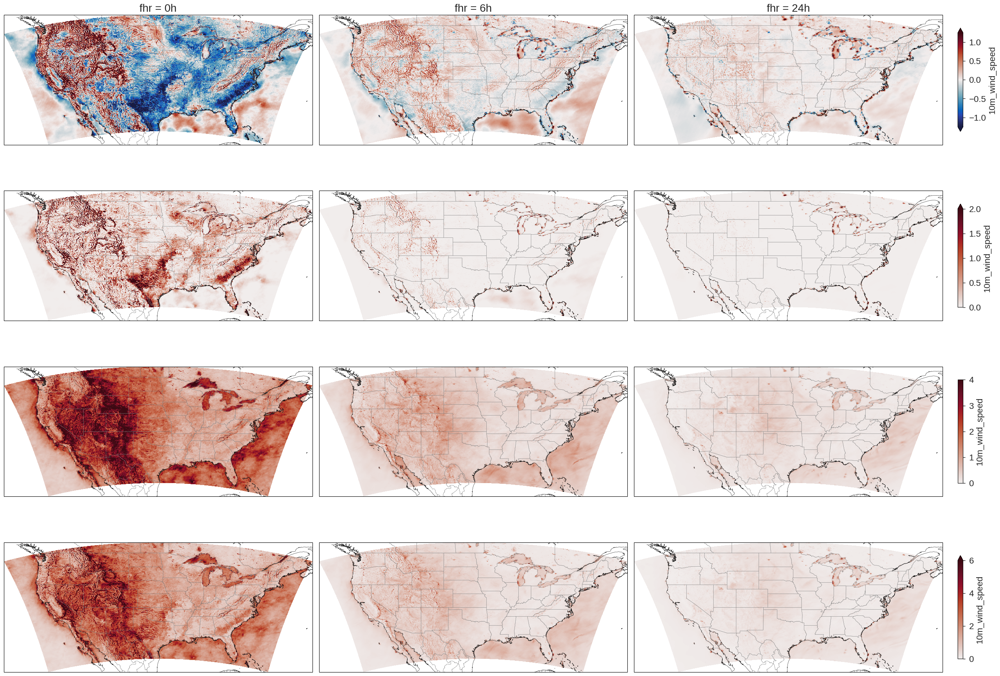

In [80]:
metrics = ["bias", "bias2", "variance", "mse"]
varname = "10m_wind_speed"
nrows = len(metrics)
ncols = len(fhrs)
fig, axs = plt.subplots(nrows, ncols, figsize=(8.5*ncols, 4.5*nrows), constrained_layout=True, sharey=True, sharex=True, subplot_kw={"projection": ccrs.PlateCarree()})

vmin = {
    "bias": -1.25,
    "bias2": 0,
    "variance": 0,
    "mse": 0,
}

vmax = {
    "bias": 1.25,
    "bias2": 2,
    "variance": 4,
    "mse": 6,
}
for metric, axr in zip(metrics, axs):
    xds = dsdict[metric]
    for fhr, ax in zip(fhrs, axr):

        gs = ax.get_subplotspec()
        is_last_col = ax.get_subplotspec().is_last_col()
        xds[varname].sel(fhr=fhr).plot(
            ax=ax,
            x="longitude",
            y="latitude",
            vmin=vmin[metric],
            vmax=vmax[metric],
            cmap="cmo.balance" if metric == "bias" else "cmo.amp",
            transform=ccrs.PlateCarree(),
            add_colorbar=True if is_last_col  else False,
            cbar_kwargs={
                "shrink": .6,
            } if is_last_col else None, 
        )
        ax.add_feature(cf.STATES.with_scale('10m'), edgecolor='gray', facecolor='none')
        ax.add_feature(cf.COASTLINE.with_scale('10m'))
        ax.set(title="")
        if gs.is_first_row():
            ax.set(title=f"fhr = {fhr}h")
        if gs.is_last_row():
            ax.set(xlabel=f"fhr = {fhr}h")
        if gs.is_first_col():
            ax.set(ylabel=metric)
fig.savefig(f"{fig_dir}/spatial_{varname}.jpeg", dpi=300, bbox_inches="tight")

/global/homes/t/timothys/.conda/envs/eagle/lib/python3.12/site-packages/xarray/plot/facetgrid.py:685: UserWarning: The figure layout has changed to tight
  self.fig.tight_layout()


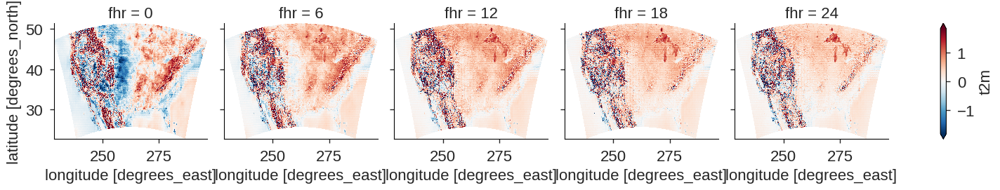

In [24]:
ds.t2m.isel(fhr=slice(0, 4+1)).plot(
    x="longitude",
    y="latitude",
    col="fhr",
    robust=True,
)

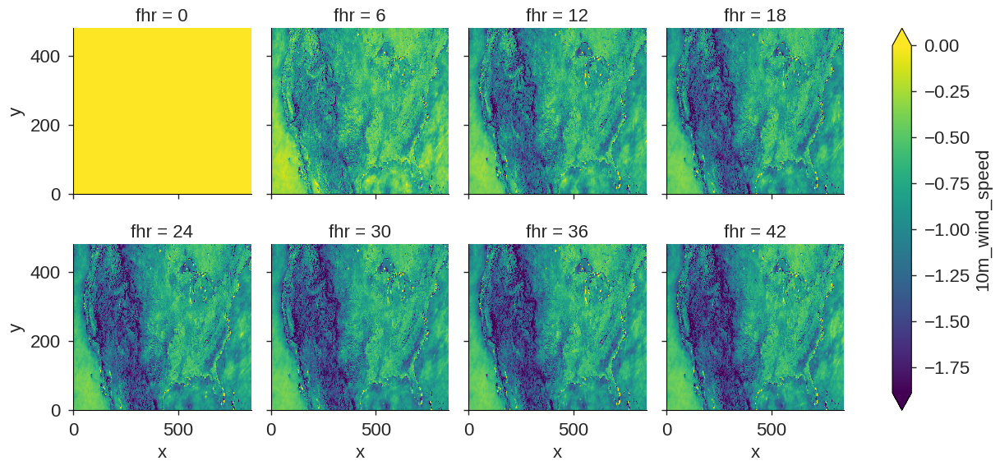

In [17]:
ds["10m_wind_speed"].isel(fhr=slice(8)).plot(col="fhr", col_wrap=4, robust=True)

/global/homes/t/timothys/.conda/envs/eagle/lib/python3.12/site-packages/xarray/plot/facetgrid.py:685: UserWarning: The figure layout has changed to tight
  self.fig.tight_layout()


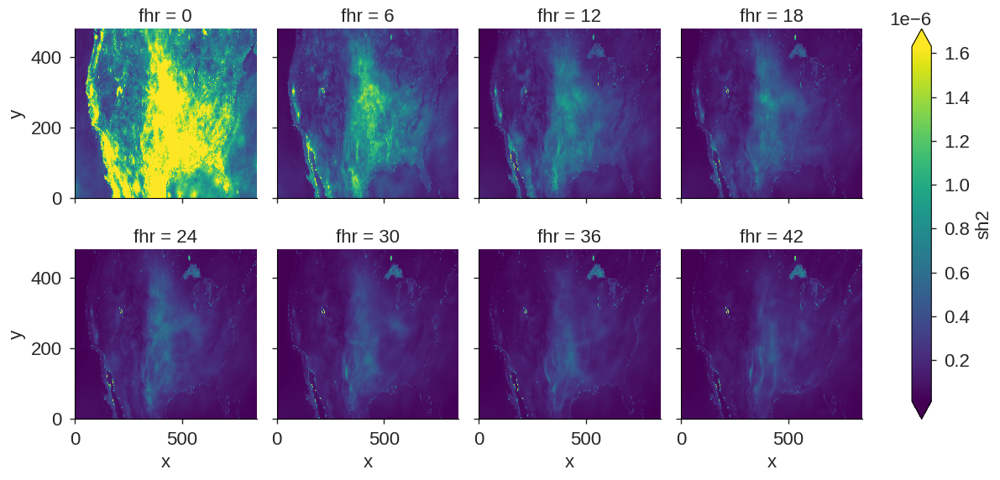

In [30]:
ds["sh2"].isel(fhr=slice(8)).plot(col="fhr", col_wrap=4, robust=True)

/global/homes/t/timothys/.conda/envs/eagle/lib/python3.12/site-packages/xarray/plot/facetgrid.py:685: UserWarning: The figure layout has changed to tight
  self.fig.tight_layout()


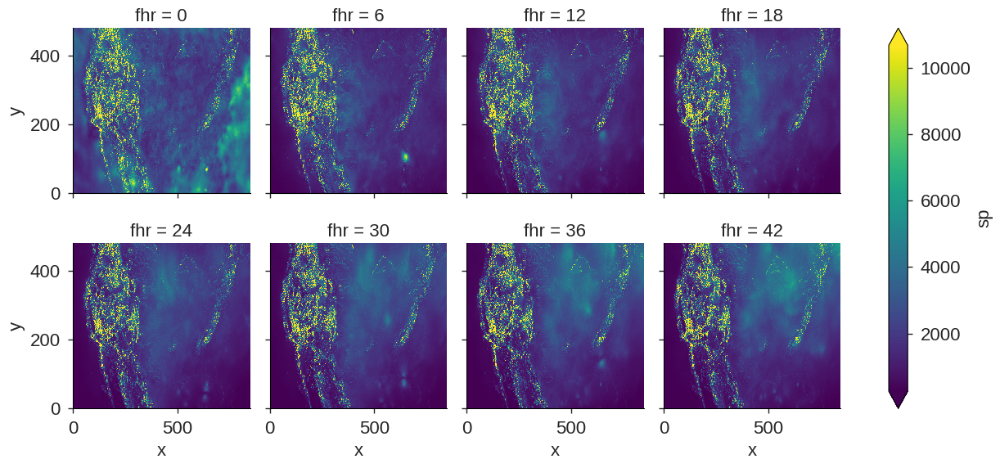

In [31]:
ds["sp"].isel(fhr=slice(8)).plot(col="fhr", col_wrap=4, robust=True)

### Atmospheric fields

/global/homes/t/timothys/.conda/envs/eagle/lib/python3.12/site-packages/xarray/plot/facetgrid.py:685: UserWarning: The figure layout has changed to tight
  self.fig.tight_layout()


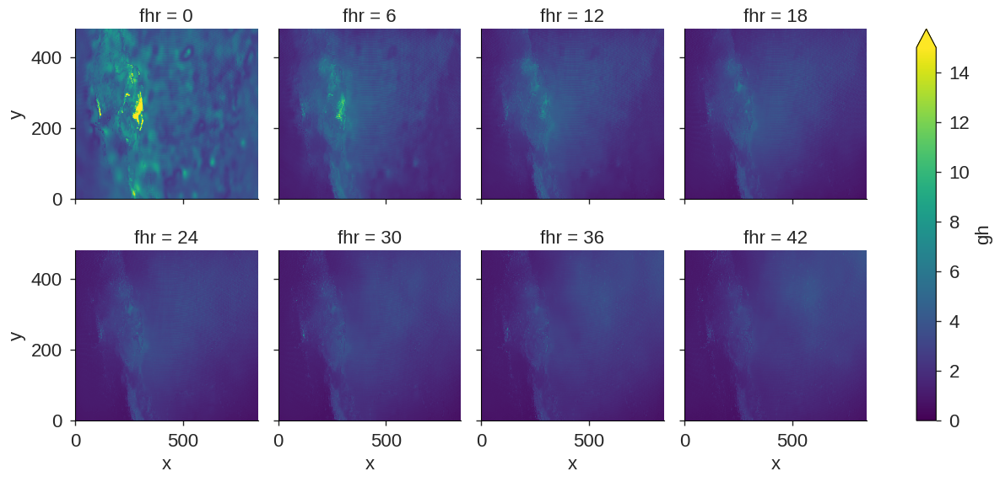

In [12]:
ds.gh.sel(level=850).isel(fhr=slice(8)).plot(col="fhr", col_wrap=4, vmax=15, vmin=0)

/global/homes/t/timothys/.conda/envs/eagle/lib/python3.12/site-packages/xarray/plot/facetgrid.py:685: UserWarning: The figure layout has changed to tight
  self.fig.tight_layout()


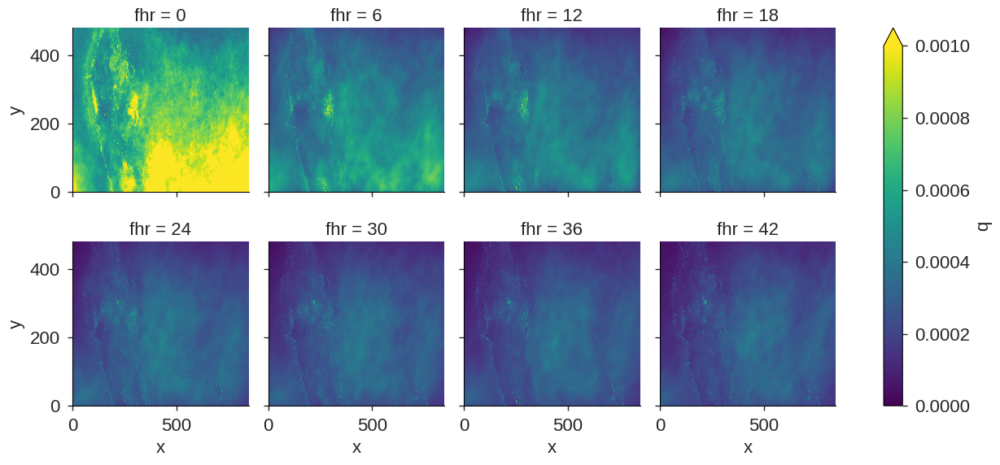

In [13]:
ds.q.sel(level=850).isel(fhr=slice(8)).plot(col="fhr", col_wrap=4, vmax=1e-3, vmin=0)

/global/homes/t/timothys/.conda/envs/eagle/lib/python3.12/site-packages/xarray/plot/facetgrid.py:685: UserWarning: The figure layout has changed to tight
  self.fig.tight_layout()


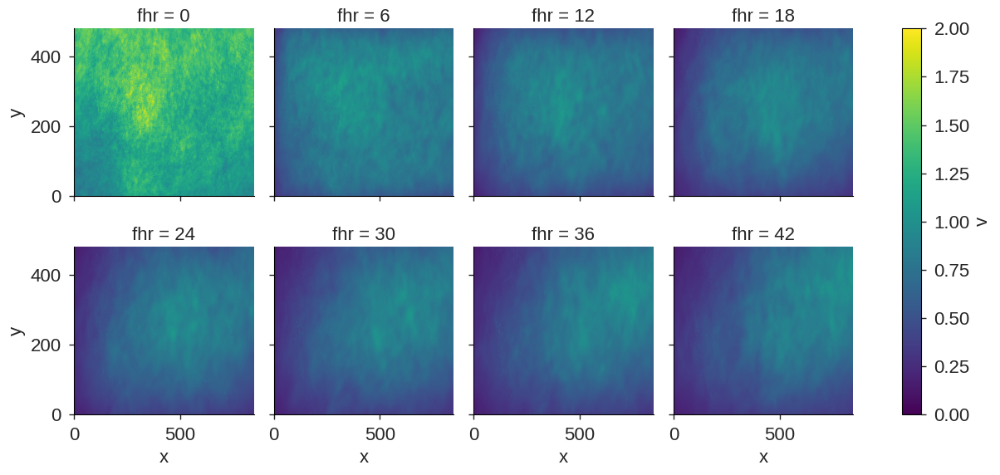

In [14]:
ds.v.sel(level=500).isel(fhr=slice(8)).plot(col="fhr", col_wrap=4, vmax=2, vmin=0)

## Little detour

It looks like the geopotential fields for Nested-EAGLE GFS ICs has some numerical artifacts. The plots below 
confirm that this is just in the GFS, not the HRRR data, and may even be in the parent dataset (lat/lon), in 
addition to being propagated to the HRRR regrid.

This doesn't really have an impact on anything scientifically for this study, though.

In [16]:
hds = xr.open_zarr("/pscratch/sd/t/timothys/nested-eagle/0.25deg-06km/baselines/hrrr-forecasts-vs-hrrr-analysis/hrrr.forecasts.zarr")

In [17]:
gh = hds.gh.sel(level=500, fhr=0)

In [18]:
ghbar = gh.mean("t0").compute()

In [19]:
ganom = gh - ghbar

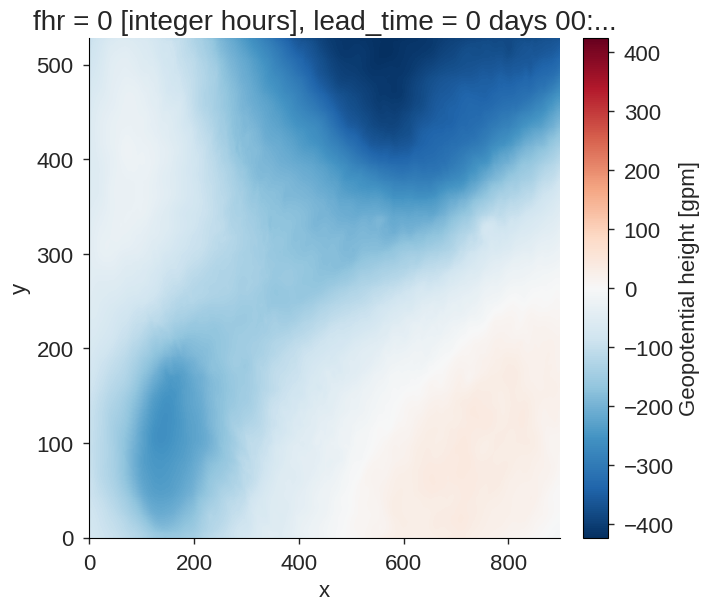

In [20]:
ganom.sel(t0="2023-02-01T06").plot()

In [27]:
gds = xr.open_zarr("/pscratch/sd/t/timothys/nested-eagle/0.25deg-06km/baselines/gfs-forecasts-vs-hrrr-analysis/gfs.forecasts.zarr")

In [28]:
ghg = gds.gh.sel(level=500, fhr=0)

In [23]:
ghgbar = ghg.mean("t0").compute()

In [24]:
ghganom = ghg - ghgbar

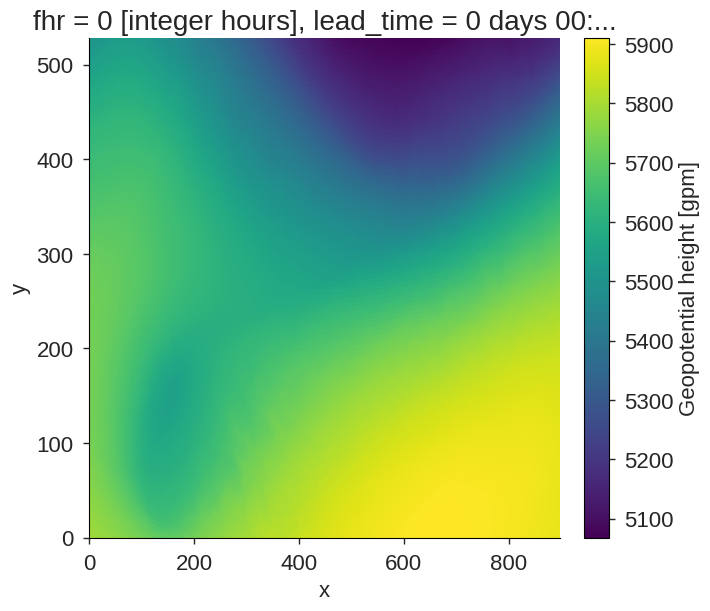

In [29]:
ghg.sel(t0="2023-02-01T06").plot()

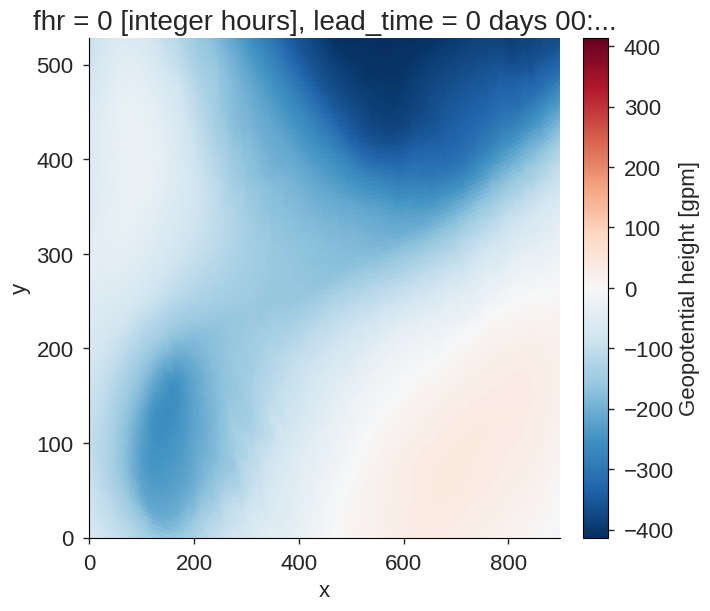

In [25]:
ghganom.sel(t0="2023-02-01T06").plot()

In [32]:
gds = xr.open_zarr("/pscratch/sd/t/timothys/nested-eagle/0.25deg-06km/baselines/gfs-forecasts-vs-gfs-analysis/gfs.forecasts.zarr")

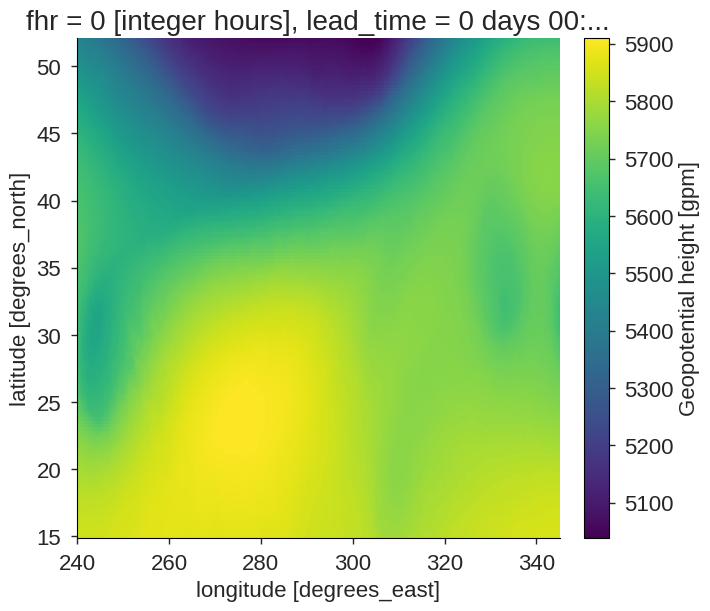

In [38]:
gds.gh.sel(
    level=500,
    fhr=0,
    t0="2023-02-01T06",
    latitude=slice(52, 15),
    longitude=slice(-120+360, -15+360),
).plot()